In [1]:
# libraries used
import numpy as np
import pandas as pd

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR

from scipy.stats import randint as sp_randint
from scipy.stats import uniform
from scipy.stats import loguniform
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import explained_variance_score
from sklearn.metrics import max_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline

import matplotlib.pyplot as plt

In [2]:
# importing the dataset

data = pd.read_csv('ensembleMean_Spain.csv')

First of all, we split the data set into training and testing in order to get a higher precision of metrics. 

The training part includes the electricity data before year 2018 while the testing set includes the electricity data after 2018. 

In [3]:
# splitting data set into training set and testing set (OUTER)

train = data[data['time']<'2018-01-01 00:00:00'] # trainig set are data from dates before 2018
test = data[data['time']>='2018-01-01 00:00:00'] # testing set are data from dates after 2018

In [4]:
# splitting the sets into variables and response
y_train = train['response'].values
x_train = train[[x for x in train.columns if (x != 'response') & (x != 'time')]].values

y_test = test['response'].values
x_test = test[[x for x in test.columns if (x != 'response') & (x != 'time')]].values

In [5]:
train[train['time']=='2017-01-01 00:00:00'] # checking the first day of 2017 in order to split training from validation(INNER)

,time,norma_10_36.0_-0.5,norma_10_36.0_-1.0,norma_10_36.0_-1.5,norma_10_36.0_-2.0,norma_10_36.0_-2.5,norma_10_36.0_-3.0,norma_10_36.0_-3.5,norma_10_36.0_-4.0,norma_10_36.0_-4.5,...,v100_44.0_-9.0,v100_44.0_-9.5,v100_44.0_0.0,v100_44.0_0.5,v100_44.0_1.0,v100_44.0_1.5,v100_44.0_2.0,v100_44.0_2.5,v100_44.0_3.0,response
5848,2017-01-01 00:00:00,1.906174,2.611856,3.791657,4.621365,5.310724,6.139571,7.04824,7.666611,7.167265,...,-0.622075,-0.645622,0.578852,0.635822,0.834078,1.299713,1.548102,1.428845,0.800656,111150.249


In [6]:
# Splitting indices to create a custom cv (in order to tune the hyper-parameters)

train_indices = list(range(0,5848))             # dates before 2017 to train
test_indices = list(range(5848, len(train)))    # dates from 2017 to 2018 to validate (INNER)
custom_cv = [(train_indices, test_indices)]

In [7]:
# Pipelines for GB
pipe_gb = Pipeline([('scale',StandardScaler()),
                    ('dim_red', PCA(random_state=10)),
                    ('model',GradientBoostingRegressor(random_state = 10))
                   ])

### ALL VARIABLES

Gradient Boosting

For the pipeline of gradient boosting, we tune 5 different hyperparameters: 

**hyperparameter of PCA:** 

- n_components, it indicates the % of variance that the PCA will explain; 


**hyperparameters of GB:** 
- learning_rate determines the weight of each tree added to the global model;
- n_estimators which is the number of trees in the forest;
- max_depth which is the maximum number of levels in each decision tree;
- min_samples_leaf which is the minimum number of instances allowed in a leaf node;

In [8]:
params_gb1 = {'dim_red__n_components': [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95],
              'model__learning_rate': loguniform(0.0001, 0.33),
              'model__max_depth': sp_randint(3, 5), 
              'model__min_samples_leaf': sp_randint(40, 50),
              'model__n_estimators': sp_randint(800, 1000)}
                    
gb_search1 = RandomizedSearchCV(pipe_gb, params_gb1, cv=custom_cv, random_state = 10)
gb1 = gb_search1.fit(x_train, y_train).best_estimator_

In [9]:
gb1

Pipeline(memory=None,
         steps=[('scale',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('dim_red',
                 PCA(copy=True, iterated_power='auto', n_components=0.9,
                     random_state=10, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('model',
                 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                           criterion='friedman_mse', init=None,
                                           learning_rate=0.13625435150371512,
                                           loss='ls', max_depth=3,
                                           max_features=None,
                                           max_leaf_nodes=None,
                                           min_impurity_decrease=0.0,
                                           min_impurity_split=None,
                                           min_samples_leaf=41,
                        

**The best parameters are as follows:**

In [10]:
gb_search1.best_params_

{'dim_red__n_components': 0.9,
 'model__learning_rate': 0.13625435150371512,
 'model__max_depth': 3,
 'model__min_samples_leaf': 41,
 'model__n_estimators': 900}

In [11]:
gb1_pred_train = gb1.predict(x_train)
gb1_pred_test = gb1.predict(x_test)

In [12]:
ve_train = explained_variance_score(y_train, gb1_pred_train)
ve_test = explained_variance_score(y_test, gb1_pred_test)
print('explained variance of training set:',(ve_train))
print('explained variance of testing set:',(ve_test))
# Maximum error
me_train = max_error(gb1_pred_train, y_train)
me_test = max_error(gb1_pred_test, y_test)
print('maximum error of training set:',(me_train))
print('maximum error of testing set:',(me_test))
# mean absolute error: datos mal predichos, no al cuadrado, menor peso
mae_train = mean_absolute_error(gb1_pred_train, y_train)
mae_test = mean_absolute_error(gb1_pred_test, y_test)
print('mae of training set:',(mae_train))
print('mae of testing set:',(mae_test))
# mean squared error: al cuadrado 
# raiz de mse
mse_train = mean_squared_error(gb1_pred_train, y_train)
mse_test = mean_squared_error(gb1_pred_test, y_test)
print('mse of training set:',(mse_train))
print('mse of testing set:',(mse_test))
rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)
print('rmse of training set:',(rmse_train))
print('rmse of testing set:',(rmse_test))

explained variance of training set: 0.9806305215747202
explained variance of testing set: 0.924698603864709
maximum error of training set: 176825.26217830507
maximum error of testing set: 300925.9903788329
mae of training set: 21736.373391175384
mae of testing set: 43891.98105302965
mse of training set: 779957597.8572296
mse of testing set: 3270862276.3747725
rmse of training set: 27927.720957092606
rmse of testing set: 57191.45282622896


###################################

PCA Analysis

###################################

In [13]:
# splitting the sets into variables and response
y_train = train['response']
x_train = train[[x for x in train.columns if (x != 'response') & (x != 'time')]]
y_test = test['response']
x_test = test[[x for x in test.columns if (x != 'response') & (x != 'time')]]

We had the best results (metrics) using PCA then gradient boosting with all the variables, with explained variance of 95%. 
Therefore, we will analyze the components of PCA which are 8 of them.

In [14]:
pca_pipe = make_pipeline(StandardScaler(),
                         PCA(random_state = 10, n_components = 0.9)).fit(x_train)
model_pca = pca_pipe.named_steps['pca']

In [15]:
model_pca

PCA(copy=True, iterated_power='auto', n_components=0.9, random_state=10,
    svd_solver='auto', tol=0.0, whiten=False)

In [16]:
model_pca.components_.shape

(27, 3536)

In [17]:
df_components = pd.DataFrame(data = model_pca.components_,
            columns = x_train.columns,
            index = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10',
                     'PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19',
                     'PC20','PC21','PC22','PC23','PC24','PC25','PC26','PC27'])

In [18]:
# first principal component with its component
df_components.loc['PC1'].sort_values(ascending = False).head(10)

u100_37.0_-3.0    0.028967
u100_37.0_-3.5    0.028920
u10_36.5_-3.0     0.028834
u100_36.5_-3.0    0.028795
u10_37.0_-3.5     0.028639
u100_37.0_-5.0    0.028544
u10_36.5_-3.5     0.028504
u100_36.5_-2.5    0.028502
u100_37.0_-4.5    0.028413
u100_36.5_-3.5    0.028387
Name: PC1, dtype: float64

In [19]:
# second principal component
df_components.loc['PC2'].sort_values(ascending = False).head(10)

u10_41.0_0.0      0.030347
u100_41.0_0.0     0.029869
u10_41.0_0.5      0.029012
u10_40.5_0.0      0.028806
u100_41.0_0.5     0.028749
u10_41.5_-1.0     0.028321
u100_41.5_0.0     0.027936
u100_41.5_-1.0    0.027846
u100_41.5_-0.5    0.027721
u10_42.0_-1.5     0.027690
Name: PC2, dtype: float64

In [20]:
# third principal component
df_components.loc['PC3'].sort_values(ascending = False).head(10)

t2m_37.5_-6.5    0.026993
t2m_37.5_-6.0    0.026954
t2m_37.5_-5.5    0.026940
t2m_38.0_-5.5    0.026863
t2m_37.5_-5.0    0.026787
t2m_38.0_-5.0    0.026777
t2m_38.0_-4.5    0.026747
t2m_37.0_-5.0    0.026726
t2m_38.0_-6.0    0.026594
t2m_38.0_-4.0    0.026535
Name: PC3, dtype: float64

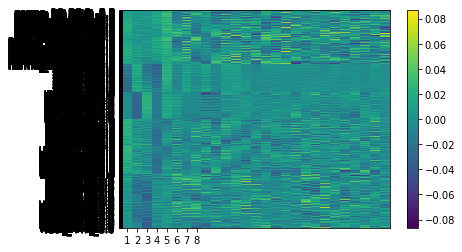

In [21]:
# Heatmap components 
fig, ax = plt.subplots(nrows=1, ncols=1)
components = model_pca.components_
plt.imshow(components.T, cmap='viridis', aspect='auto')
plt.yticks(range(len(x_train.columns)), x_train.columns)
plt.xticks(range(8), np.arange(model_pca.n_components_) + 1)
plt.grid(False)
plt.colorbar();

In [22]:
model_pca.explained_variance_ratio_

array([0.23030284, 0.17660089, 0.13042606, 0.08146808, 0.05743426,
       0.02870701, 0.02616473, 0.02273382, 0.01895002, 0.01502242,
       0.01353947, 0.01266124, 0.01131573, 0.00945948, 0.00931962,
       0.00756803, 0.0070496 , 0.00614629, 0.00564834, 0.005202  ,
       0.00451226, 0.00442664, 0.00402388, 0.00344723, 0.00337615,
       0.00326806, 0.00314038])

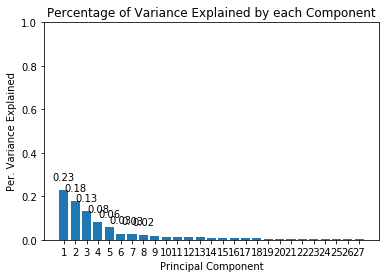

In [23]:
# plotting the explained variance by each component
fig, ax = plt.subplots(nrows=1, ncols=1)
ax.bar(
    x      = np.arange(model_pca.n_components_) + 1,
    height = model_pca.explained_variance_ratio_
)

for x, y in zip(np.arange(8) + 1, model_pca.explained_variance_ratio_):
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )

ax.set_xticks(np.arange(model_pca.n_components_) + 1)
ax.set_ylim(0, 1)
ax.set_title('Percentage of Variance Explained by each Component')
ax.set_xlabel('Principal Component')
ax.set_ylabel('Per. Variance Explained');

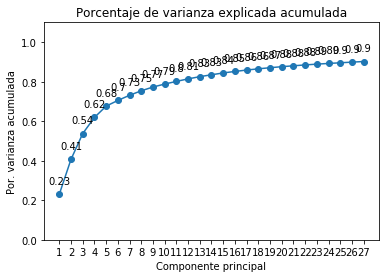

In [27]:
# plotting the cumulative expained variance
prop_varianza_acum = model_pca.explained_variance_ratio_.cumsum()

fig, ax = plt.subplots(nrows=1, ncols=1)
ax.plot(
    np.arange(27) + 1,
    prop_varianza_acum,
    marker = 'o'
)

for x, y in zip(np.arange(27) + 1, prop_varianza_acum):
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )

ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(model_pca.n_components_) + 1)
ax.set_title('Porcentaje de varianza explicada acumulada')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza acumulada');


In [28]:
principalComponents = pca_pipe.transform(x_train)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10',
                     'PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19',
                     'PC20','PC21','PC22','PC23','PC24','PC25','PC26','PC27'])

In [29]:
# new data matrix (training set) after dimension reduction
principalDf

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27
0,-28.396176,48.740770,-12.099286,-3.096553,-0.361181,-10.622106,-2.305284,-11.274410,15.461123,-9.136724,...,-4.488174,3.350953,7.795489,-1.294025,4.071562,4.545076,-6.011907,-4.253881,-3.886594,-5.932644
1,-33.526134,46.867496,-14.104725,-0.708450,0.879120,-16.191272,-2.063324,-12.123189,17.145009,-4.979177,...,-7.962797,1.571038,8.139358,-2.435055,5.125709,2.913524,-6.526677,-5.520037,-2.668814,-3.894623
2,-39.147798,44.279905,-17.958147,0.041602,5.133157,-18.355485,-0.453883,-7.037843,15.129458,-1.364115,...,-8.948226,0.934833,6.398564,-1.224763,4.383553,1.868883,-6.400659,-6.990038,-0.403023,-1.303218
3,-44.353769,40.152461,-22.896186,-5.052566,11.488353,-16.404487,2.936023,0.901772,12.599097,-1.188259,...,-7.490124,3.508612,4.308817,3.382640,2.791415,0.993034,-4.508888,-6.322279,3.030568,-0.087657
4,-45.478248,26.647914,-19.790867,-18.376753,11.923901,-7.027270,0.669402,6.885867,12.683399,-1.374988,...,-1.585930,4.242760,1.162631,2.077899,1.657637,1.989197,-2.590505,-2.569388,2.844566,-3.318248
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8763,30.442915,2.631728,-53.136025,-15.042487,14.873777,5.421201,10.531263,-12.397254,-7.474568,6.503225,...,5.775027,-2.614509,-1.762988,-5.498980,1.793516,3.773485,4.736811,-5.297735,0.146048,-3.257187
8764,58.346090,1.185501,-38.550254,-20.930618,30.063482,-6.513815,16.504125,-8.603462,2.461978,2.222515,...,0.743308,1.638247,-5.267978,-10.966813,-1.579194,7.208626,4.488958,-3.553546,-1.608757,-3.545662
8765,66.467252,13.705696,-17.629433,-25.203859,28.246221,-10.996519,14.361290,8.915069,2.670672,1.412448,...,-9.730141,2.299730,-1.134746,-4.619972,-1.082280,6.181542,-0.655322,5.549833,2.242340,-0.028241
8766,57.431662,34.087161,-7.983648,-29.704182,24.193721,-6.839407,5.034738,15.626954,-4.755590,0.684249,...,-9.020103,-2.074338,-0.732455,2.708602,0.815449,2.562390,-0.932503,6.331799,4.294538,-1.107430


In [30]:
import seaborn as sns

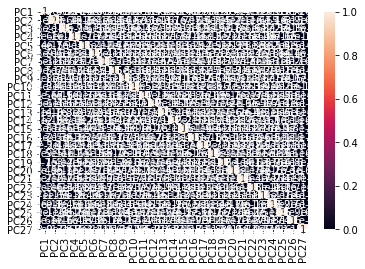

In [31]:
# not correlated at all after the transformation
corr = principalDf
Var_Corr = corr.corr()
corr_plot = sns.heatmap(Var_Corr, xticklabels=Var_Corr.columns, yticklabels=Var_Corr.columns, annot=True)

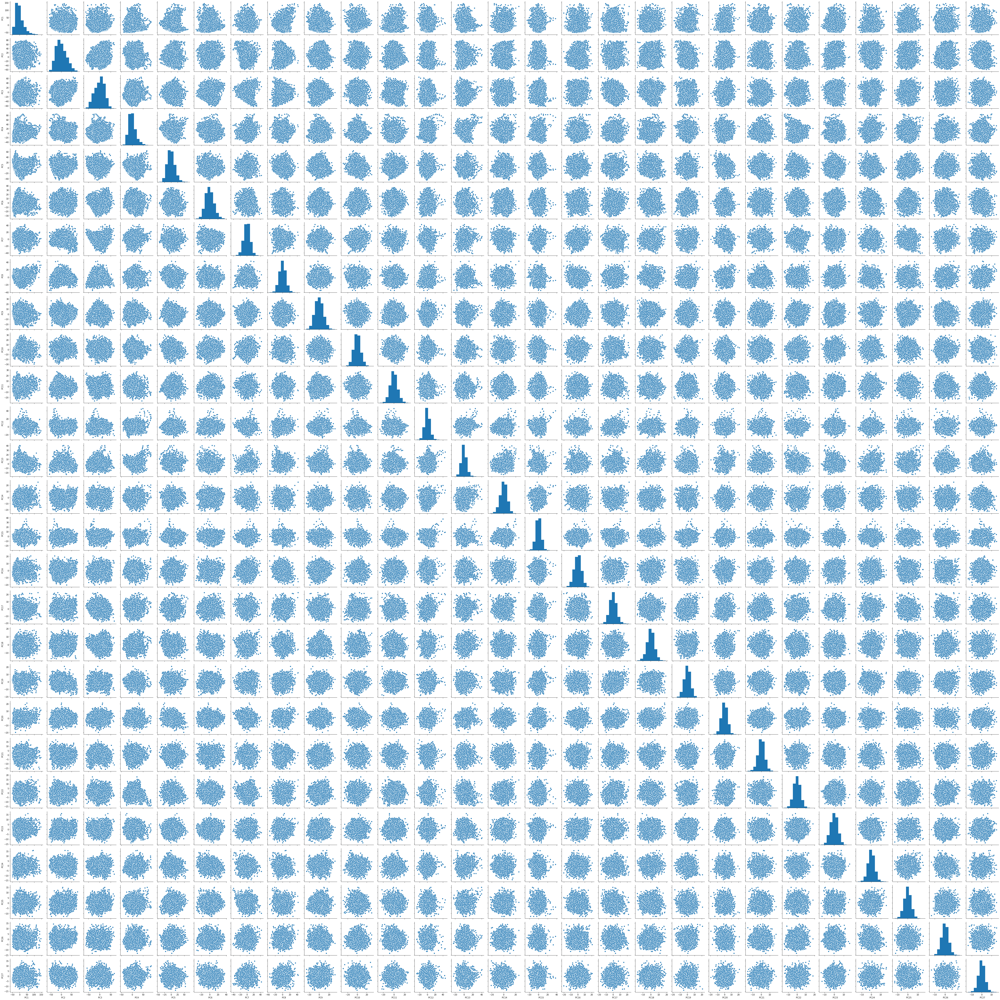

In [32]:
sns.pairplot(principalDf)
pairplot = plt.tight_layout()

In [33]:
principalDf['y']=y_train

In [34]:
principalDf

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,y
0,-28.396176,48.740770,-12.099286,-3.096553,-0.361181,-10.622106,-2.305284,-11.274410,15.461123,-9.136724,...,3.350953,7.795489,-1.294025,4.071562,4.545076,-6.011907,-4.253881,-3.886594,-5.932644,366239.055
1,-33.526134,46.867496,-14.104725,-0.708450,0.879120,-16.191272,-2.063324,-12.123189,17.145009,-4.979177,...,1.571038,8.139358,-2.435055,5.125709,2.913524,-6.526677,-5.520037,-2.668814,-3.894623,304167.381
2,-39.147798,44.279905,-17.958147,0.041602,5.133157,-18.355485,-0.453883,-7.037843,15.129458,-1.364115,...,0.934833,6.398564,-1.224763,4.383553,1.868883,-6.400659,-6.990038,-0.403023,-1.303218,244681.395
3,-44.353769,40.152461,-22.896186,-5.052566,11.488353,-16.404487,2.936023,0.901772,12.599097,-1.188259,...,3.508612,4.308817,3.382640,2.791415,0.993034,-4.508888,-6.322279,3.030568,-0.087657,173166.357
4,-45.478248,26.647914,-19.790867,-18.376753,11.923901,-7.027270,0.669402,6.885867,12.683399,-1.374988,...,4.242760,1.162631,2.077899,1.657637,1.989197,-2.590505,-2.569388,2.844566,-3.318248,180093.774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8763,30.442915,2.631728,-53.136025,-15.042487,14.873777,5.421201,10.531263,-12.397254,-7.474568,6.503225,...,-2.614509,-1.762988,-5.498980,1.793516,3.773485,4.736811,-5.297735,0.146048,-3.257187,670181.022
8764,58.346090,1.185501,-38.550254,-20.930618,30.063482,-6.513815,16.504125,-8.603462,2.461978,2.222515,...,1.638247,-5.267978,-10.966813,-1.579194,7.208626,4.488958,-3.553546,-1.608757,-3.545662,809605.944
8765,66.467252,13.705696,-17.629433,-25.203859,28.246221,-10.996519,14.361290,8.915069,2.670672,1.412448,...,2.299730,-1.134746,-4.619972,-1.082280,6.181542,-0.655322,5.549833,2.242340,-0.028241,848274.315
8766,57.431662,34.087161,-7.983648,-29.704182,24.193721,-6.839407,5.034738,15.626954,-4.755590,0.684249,...,-2.074338,-0.732455,2.708602,0.815449,2.562390,-0.932503,6.331799,4.294538,-1.107430,926926.224


In [35]:
## base line model 

from sklearn import linear_model

x_train_PCA = pca_pipe.transform(x_train)
x_test_PCA = pca_pipe.transform(x_test)

In [36]:
lm = linear_model.LinearRegression()
lm.fit(x_train_PCA, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [37]:
lm_pred_train = lm.predict(x_train_PCA)
lm_pred_test = lm.predict(x_test_PCA)

In [38]:
ve_train = explained_variance_score(y_train, lm_pred_train)
ve_test = explained_variance_score(y_test, lm_pred_test)
print('explained variance of training set:',(ve_train))
print('explained variance of testing set:',(ve_test))
# Maximum error
me_train = max_error(lm_pred_train, y_train)
me_test = max_error(lm_pred_test, y_test)
print('maximum error of training set:',(me_train))
print('maximum error of testing set:',(me_test))
# mean absolute error: datos mal predichos, no al cuadrado, menor peso
mae_train = mean_absolute_error(lm_pred_train, y_train)
mae_test = mean_absolute_error(lm_pred_test, y_test)
print('mae of training set:',(mae_train))
print('mae of testing set:',(mae_test))
# mean squared error: al cuadrado 
# raiz de mse
mse_train = mean_squared_error(lm_pred_train, y_train)
mse_test = mean_squared_error(lm_pred_test, y_test)
print('mse of training set:',(mse_train))
print('mse of testing set:',(mse_test))
rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)
print('rmse of training set:',(rmse_train))
print('rmse of testing set:',(rmse_test))

explained variance of training set: 0.9056286627434742
explained variance of testing set: 0.9129873145514632
maximum error of training set: 605391.614918771
maximum error of testing set: 368135.0677015754
mae of training set: 46641.36256237306
mae of testing set: 47912.43046448535
mse of training set: 3800083817.2859144
mse of testing set: 3782092946.8410444
rmse of training set: 61644.81987390274
rmse of testing set: 61498.72313179392
